In [1]:
%load_ext autoreload
%autoreload 2

In [55]:
import numpy as np

import pandas as pd

from tslearn.preprocessing import TimeSeriesScalerMeanVariance as tsmv

from hdbscan import HDBSCAN

from tensorflow.keras.callbacks import EarlyStopping

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

from modules.utils import create_filters

from modules.visualization import curves_visualizer, profiles_visualizer
from modules.visualization import visualize_cluster_overlap

from modules.clustering import rule_based_clustering, auto_k_means
from modules.autoencoders import RecurrentAutoEncoder

In [3]:
def sns_styleset():
    sns.set(context='paper', style='whitegrid', font='DejaVu Sans')
    matplotlib.rcParams['figure.dpi']        = 300
    matplotlib.rcParams['axes.linewidth']    = 1
    matplotlib.rcParams['xtick.major.width'] = 1
    matplotlib.rcParams['ytick.major.width'] = 1
    matplotlib.rcParams['xtick.major.size']  = 3
    matplotlib.rcParams['ytick.major.size']  = 3
    matplotlib.rcParams['xtick.minor.size']  = 2
    matplotlib.rcParams['ytick.minor.size']  = 2
    matplotlib.rcParams['font.size']         = 11
    matplotlib.rcParams['axes.titlesize']    = 11
    matplotlib.rcParams['axes.labelsize']    = 12
    matplotlib.rcParams['legend.fontsize']   = 10
    matplotlib.rcParams['xtick.labelsize']   = 10
    matplotlib.rcParams['ytick.labelsize']   = 10
    
sns_styleset()

## SET GLOBALS AND PREPARE DATA

In [4]:
TARGETS = [
    'gpm',
    'kda'   
]
target_rmp = {
    'gpm': 'GPM',
    'kda': 'KDA'   
}
TYPE = 'non_smoothed'

In [5]:
features_embedding = np.load(F'results\\arrays\\embedding_feat_{TYPE}.npy')
viz_embedding = np.load(F'results\\arrays\\embedding_viz_{TYPE}.npy') 

df = pd.read_csv(f'data\\df_{TYPE}.csv')
df = df.sort_values(['account_id', 'nth_match', 'date'])
df['global'] = 1
df['rating'] = (df['rating'] - df['rating'].min()) / (df['rating'].max() - df['rating'].min())
df.head()

,account_id,region,date,rating,position,gpm,kda,kdr,nth_match,win,time_gap,nth_day,rule_clusters,hdb_clusters,rnn_clusters,km_clusters,global
0,5296,EUW1,2016-02-02,0.492813,UTILITY,365.238971,4.500000,0.500000,1,True,NaN,1,-1,5,4,0,1
1,5296,EUW1,2016-02-02,0.508419,BOTTOM,466.007360,1.909091,0.818182,2,False,0.193543,1,-1,5,4,0,1
2,5296,EUW1,2016-02-03,0.492402,UTILITY,323.397914,2.375000,0.000000,3,False,18.759171,2,-1,5,4,0,1
3,5296,EUW1,2016-02-05,0.476797,UTILITY,329.318182,3.666667,0.333333,4,True,36.681478,4,-1,5,4,0,1
4,5296,EUW1,2016-02-05,0.491581,UTILITY,246.636446,0.800000,0.200000,5,False,0.293305,4,-1,5,4,0,1


In [73]:
accounts_to_retain = create_filters(
    df=df, 
    targets=TARGETS, 
    cal_period=10,
    n_bins=100, # we divide median perfromance over first cal_period matches in 100 bins
    to_retain_bins=[i for i in range(40, 60)] # we retain account in bin 40 to 60 
)

c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\sklearn\preprocessing\_discretization.py:222: UserWarning: Bins whose width are too small (i.e., <= 1e-8) in feature 1 are removed. Consider decreasing the number of bins.
  'decreasing the number of bins.' % jj)


## EXPLORATORY VISUALIZATIONS
#### EFFECT OF REGION AND POSITION ON TARGET METRICS

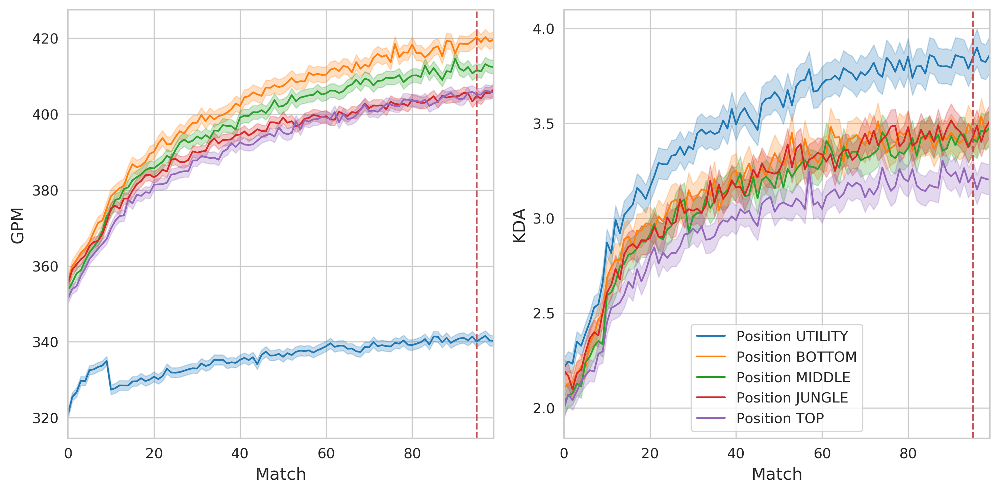

In [74]:
curves_visualizer(
    df=df, 
    grouper='position', 
    targets=TARGETS,
    rows=1,
    columns=2,
    target_rmp=target_rmp,
    grouper_rmp={'position': 'Position'},
    cmap='tab10',
    legend=True,
    accounts_to_retain=accounts_to_retain #add dictionary of accounts to retain if you want to filter out the others
)

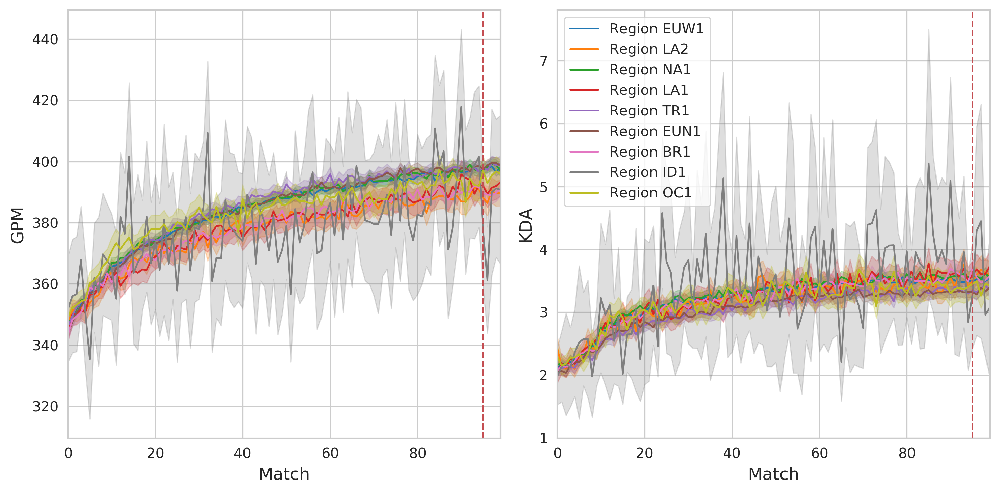

In [75]:
curves_visualizer(
    df=df, 
    grouper='region', 
    targets=TARGETS,
    rows=1,
    columns=2,
    target_rmp=target_rmp,
    grouper_rmp={'region': 'Region'},
    cmap='tab10',
    legend=True,
    accounts_to_retain=accounts_to_retain #add dictionary of accounts to retain if you want to filter out the others
)

## GLOBAL UMAP VISULIZATION
#### GENERAL POPULATION TREND OF TARGET METRICS

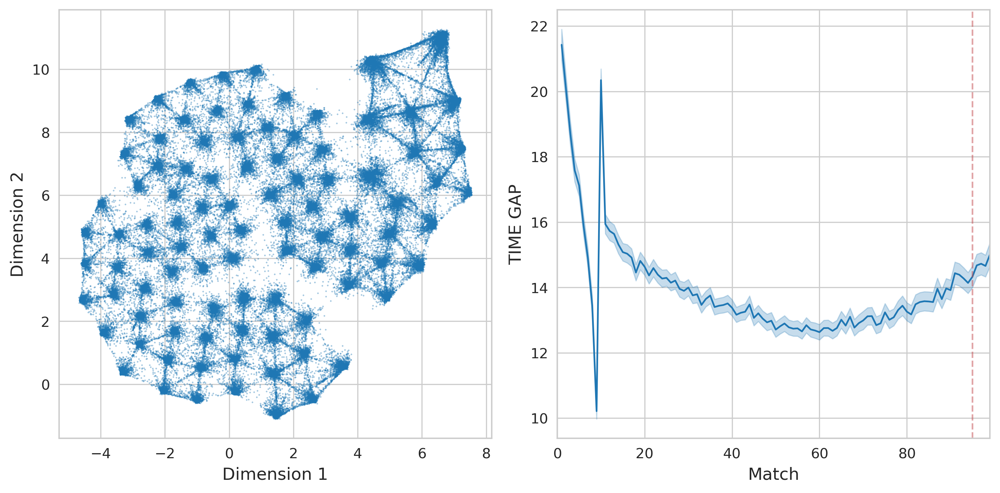

In [68]:
profiles_visualizer(
    df=df, 
    target='time_gap', 
    dim_reduction=viz_embedding, 
    grouper='global',
    grouper_rmp={'global': 'Global'},
    target_rmp={'time_gap': 'TIME GAP'},
    cmap='tab10',
    legend=False
)

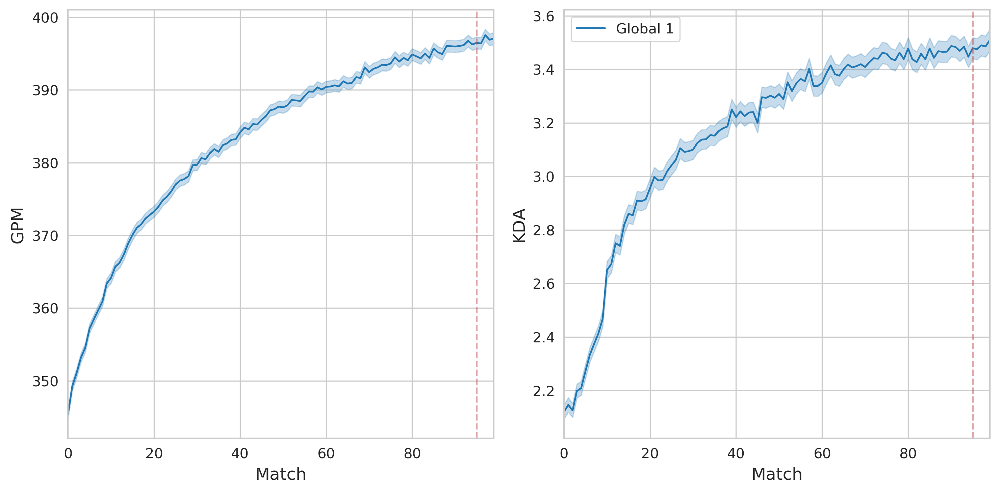

In [76]:
curves_visualizer(
    df=df, 
    grouper='global', 
    targets=TARGETS,
    rows=1,
    columns=2,
    target_rmp=target_rmp,
    grouper_rmp={'global': 'Global'},
    cmap='tab10',
    accounts_to_retain=accounts_to_retain
)

## RULE BASED CLUSTERING

In [57]:
rule_labels = rule_based_clustering(df, feature='nth_day')

df['rule_clusters'] = df['account_id'].map(
    {acc_id: label for acc_id, label in zip(df['account_id'].unique(), rule_labels)}
)

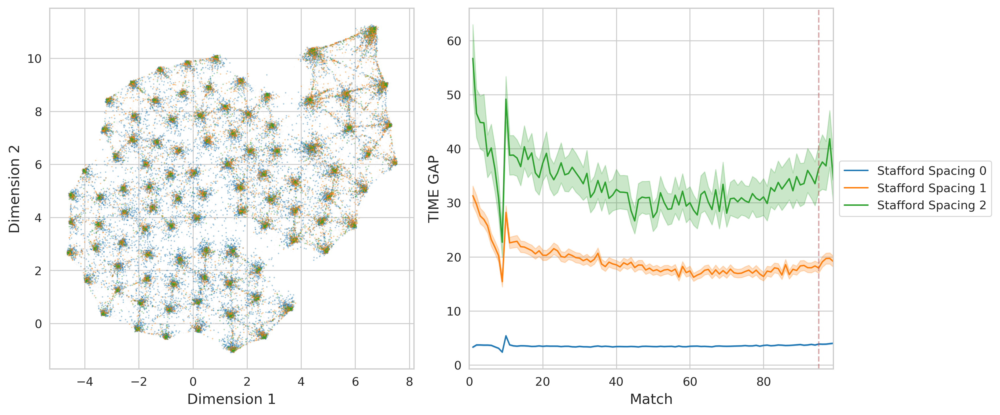

In [59]:
profiles_visualizer(
    df=df, 
    target='time_gap', 
    dim_reduction=viz_embedding, 
    grouper='rule_clusters',
    grouper_rmp={'rule_clusters': 'Stafford Spacing'},
    target_rmp={'time_gap': 'TIME GAP'},
    cmap='tab10',
    legend=True
)

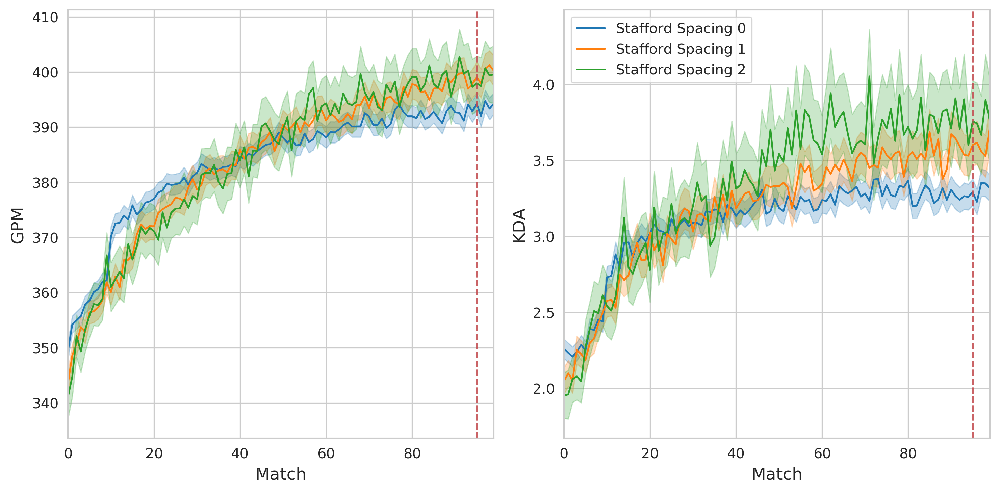

In [77]:
curves_visualizer(
    df=df[df['rule_clusters'] != -1].sort_values('rule_clusters'), 
    grouper='rule_clusters', 
    targets=TARGETS,
    rows=1,
    columns=2,
    target_rmp=target_rmp,
    grouper_rmp={'rule_clusters': 'Stafford Spacing'},
    cmap='tab10',
    legend=True,
    accounts_to_retain=accounts_to_retain #add dictionary of accounts to retain if you want to filter out the others
)

## UMAP + HDBSCAN CLUSTERING

In [44]:
hdb_clust = HDBSCAN(
    min_cluster_size=4000, 
    min_samples=200
)
hdb_clust.fit(features_embedding)

df['hdb_clusters'] = df['account_id'].map(
    {acc_id: label for acc_id, label in zip(df['account_id'].unique(), hdb_clust.labels_)}
)

HDBSCAN(algorithm='best', allow_single_cluster=False, alpha=1.0,
        approx_min_span_tree=True, cluster_selection_epsilon=0.0,
        cluster_selection_method='eom', core_dist_n_jobs=4,
        gen_min_span_tree=False, leaf_size=40,
        match_reference_implementation=False, memory=Memory(location=None),
        metric='euclidean', min_cluster_size=4000, min_samples=200, p=None,
        prediction_data=False)

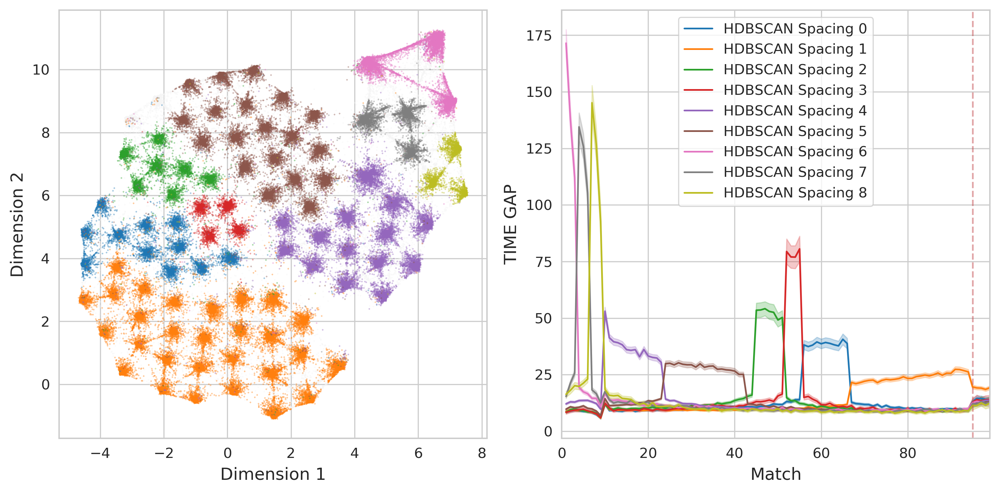

In [6]:
profiles_visualizer(
    df=df, 
    target='time_gap', 
    dim_reduction=viz_embedding, 
    grouper='hdb_clusters',
    grouper_rmp={'hdb_clusters': 'HDBSCAN Spacing'},
    target_rmp={'time_gap': 'TIME GAP'},
    cmap='tab10',
    legend=True
)

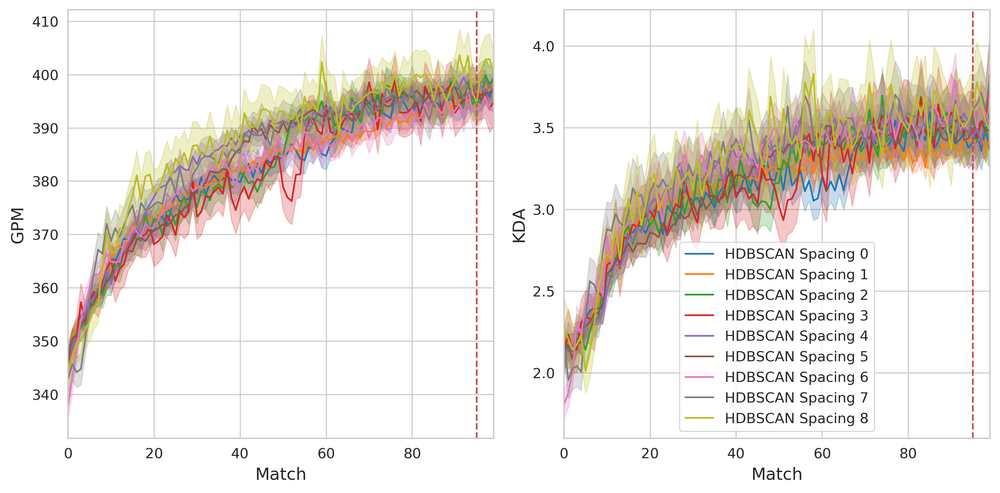

In [78]:
curves_visualizer(
    df=df[df['hdb_clusters'] != -1].sort_values('hdb_clusters'), 
    grouper='hdb_clusters', 
    targets=TARGETS,
    rows=1,
    columns=2,
    target_rmp=target_rmp,
    grouper_rmp={'hdb_clusters': 'HDBSCAN Spacing'},
    cmap='tab10',
    accounts_to_retain=accounts_to_retain #add dictionary of accounts to retain if you want to filter out the others
)

## CLUSTERING MATCHES GAP

In [6]:
df = df.sort_values(['account_id', 'nth_match'])
unique_ids = len(df['account_id'].unique())
X = df['time_gap'].values
X = X.reshape((unique_ids, 100))
X = X[:, 1:-5]
X = tsmv().fit_transform(X)

### KMeans

Clustering 2
Clustering 3
Clustering 4
Clustering 5
Clustering 6
Clustering 7
Clustering 8
Clustering 9
Optimal K found at 5


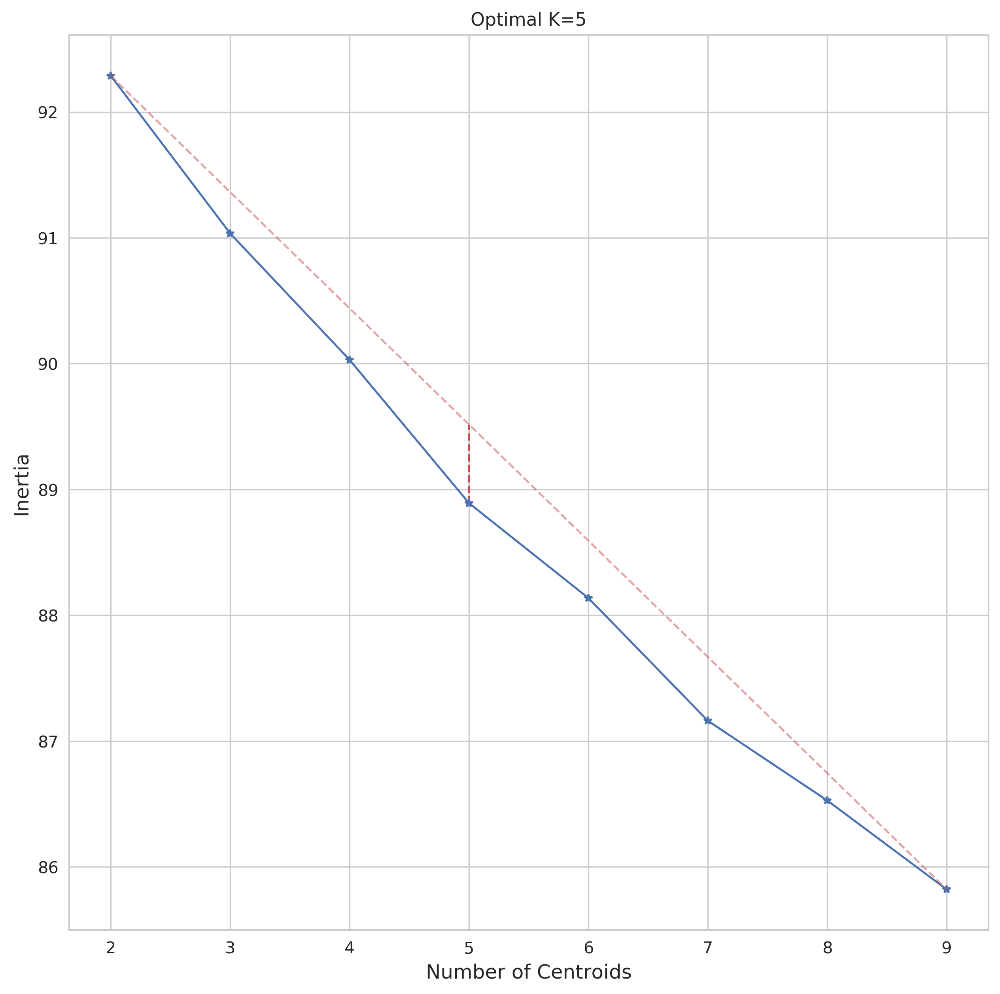

In [56]:
km_clust = auto_k_means(
    X=X, 
    min_k=2, 
    max_k=10, 
    save_path='results\\figures\\k_means', 
    max_iter=300,
    n_init=2
)
df['km_clusters'] = df['account_id'].map(
    {acc_id: label for acc_id, label in zip(df['account_id'].unique(), km_clust.labels_)}
)

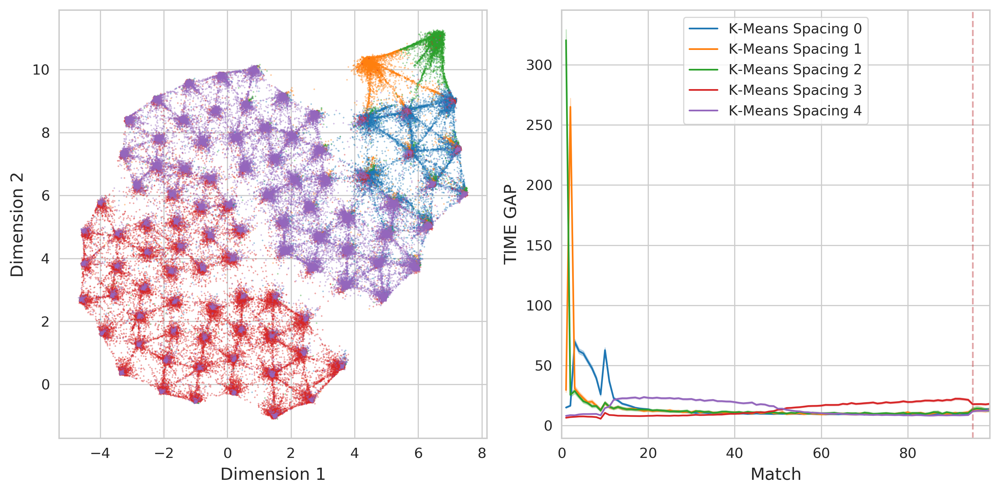

In [6]:
profiles_visualizer(
    df=df, 
    target='time_gap', 
    dim_reduction=viz_embedding, 
    grouper='km_clusters',
    grouper_rmp={'km_clusters': 'K-Means Spacing'},
    target_rmp={'time_gap': 'TIME GAP'},
    cmap='tab10',
    legend=True
)

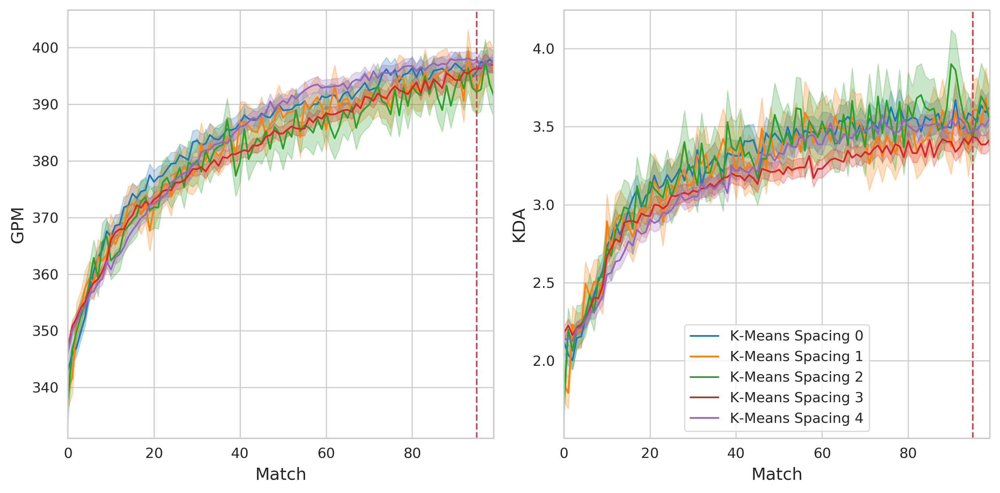

In [79]:
curves_visualizer(
    df=df.sort_values('km_clusters'), 
    grouper='km_clusters', 
    targets=TARGETS,
    rows=1,
    columns=2,
    target_rmp=target_rmp,
    grouper_rmp={'km_clusters': 'K-Means Spacing'},
    cmap='tab10',
    accounts_to_retain=accounts_to_retain #add dictionary of accounts to retain if you want to filter out the others
)

### RNN Autoencoder and K-Means

In [9]:
sequence_autoencoder = RecurrentAutoEncoder(
    X=X, 
    noise=1, 
    units=60, 
    latent_space=30, 
    loss='mae',
    optimizer='adam', 
    output_activation='linear'
)

stopper = EarlyStopping(
    monitor='val_loss',
    patience=15,
    min_delta=0.0001, 
    restore_best_weights=True
)

In [10]:
sequence_autoencoder.fit(
    X, 
    epochs=1000, 
    verbose=1, 
    batch_size=512,
    callbacks=[stopper],
    validation_split=0.2
)

Epoch 1/1000
254/254 [==============================] - 10s 38ms/step - loss: 0.4458 - val_loss: 0.5096
Epoch 2/1000
254/254 [==============================] - 9s 34ms/step - loss: 0.4339 - val_loss: 0.4708
Epoch 3/1000
254/254 [==============================] - 10s 38ms/step - loss: 0.4330 - val_loss: 0.4663
Epoch 4/1000
254/254 [==============================] - 10s 39ms/step - loss: 0.4327 - val_loss: 0.4647
Epoch 5/1000
254/254 [==============================] - 9s 37ms/step - loss: 0.4324 - val_loss: 0.4650
Epoch 6/1000
254/254 [==============================] - 11s 43ms/step - loss: 0.4324 - val_loss: 0.4632
Epoch 7/1000
254/254 [==============================] - 12s 46ms/step - loss: 0.4321 - val_loss: 0.4627
Epoch 8/1000
254/254 [==============================] - 12s 49ms/step - loss: 0.4321 - val_loss: 0.4647
Epoch 9/1000
254/254 [==============================] - 16s 62ms/step - loss: 0.4317 - val_loss: 0.4631
Epoch 10/1000
254/254 [==============================] - 16s 63ms/

In [11]:
embedding_feature = sequence_autoencoder.encode(X)

Clustering 2
Clustering 3
Clustering 4
Clustering 5
Clustering 6
Clustering 7
Clustering 8
Clustering 9
Clustering 10
Optimal K found at 5


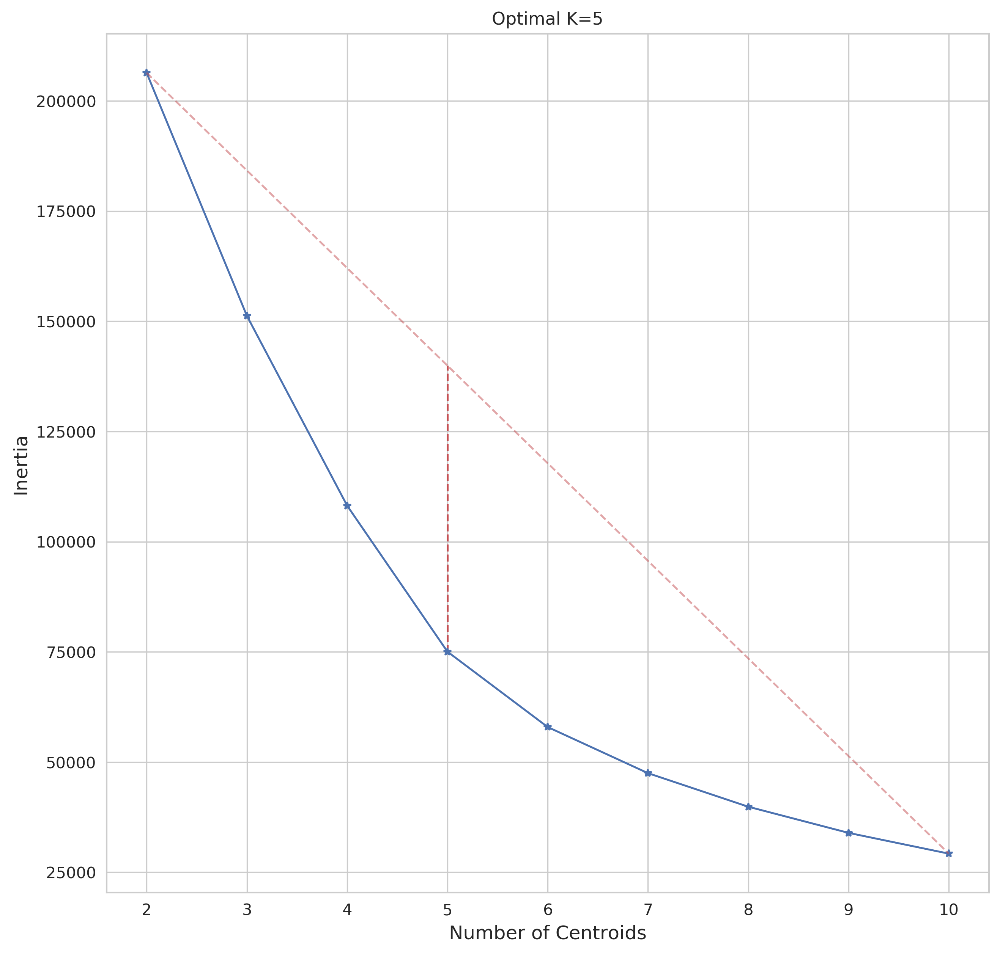

In [21]:
rnn_clust = auto_k_means(
    embedding_feature, 
    min_k=2, 
    max_k=11, 
    save_path='results\\figures\\autoenc', 
    max_iter=3000,
    n_init=2000,
    batch_size=512
)
df['rnn_clusters'] = df['account_id'].map(
    {acc_id: label for acc_id, label in zip(df['account_id'].unique(), rnn_clust.labels_)}
)

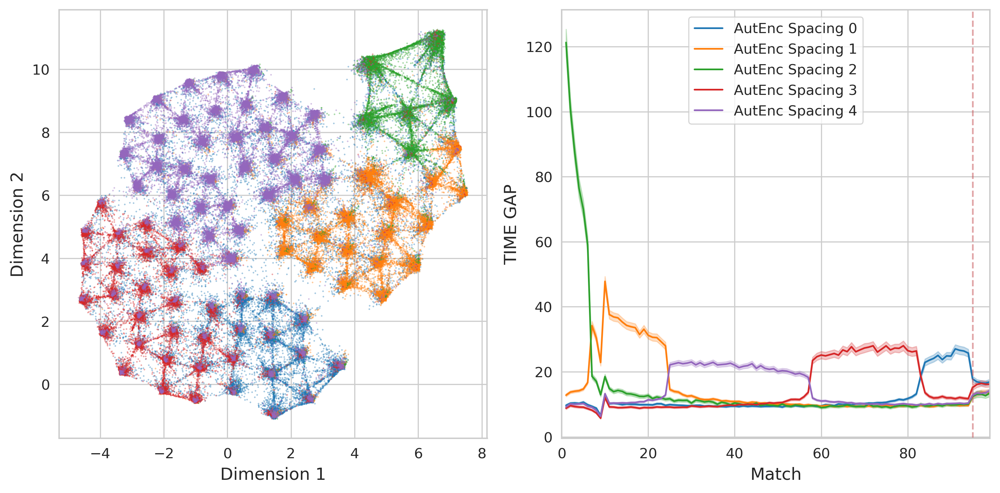

In [69]:
profiles_visualizer(
    df=df, 
    target='time_gap', 
    dim_reduction=viz_embedding, 
    grouper='rnn_clusters',
    grouper_rmp={'rnn_clusters': 'AutEnc Spacing'},
    target_rmp={'time_gap': 'TIME GAP'},
    cmap='tab10',
    legend=True
)

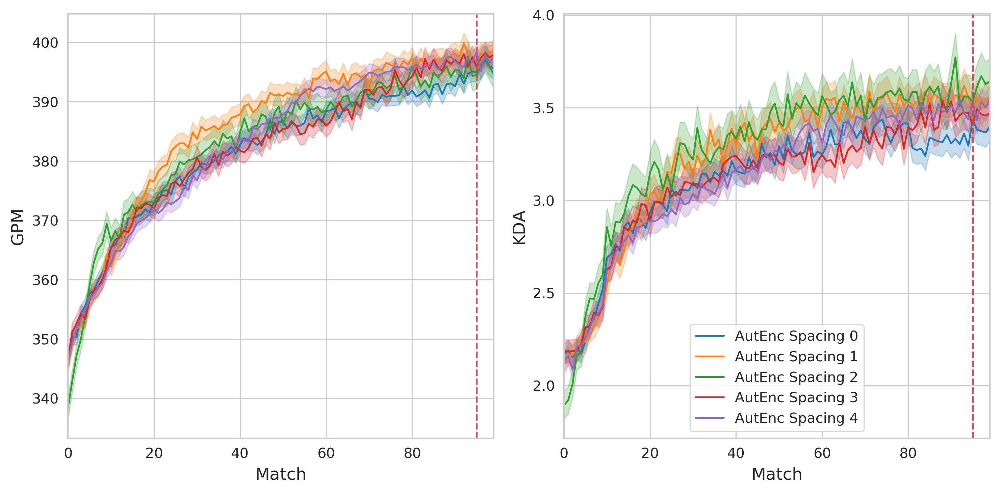

In [80]:
curves_visualizer(
    df=df.sort_values('rnn_clusters'),
    grouper='rnn_clusters', 
    targets=TARGETS,
    rows=1,
    columns=2,
    target_rmp=target_rmp,
    grouper_rmp={'rnn_clusters': 'AutEnc Spacing'},
    cmap='tab10',
    accounts_to_retain=accounts_to_retain #add dictionary of accounts to retain if you want to filter out the others
)

## Clusters Overlapping

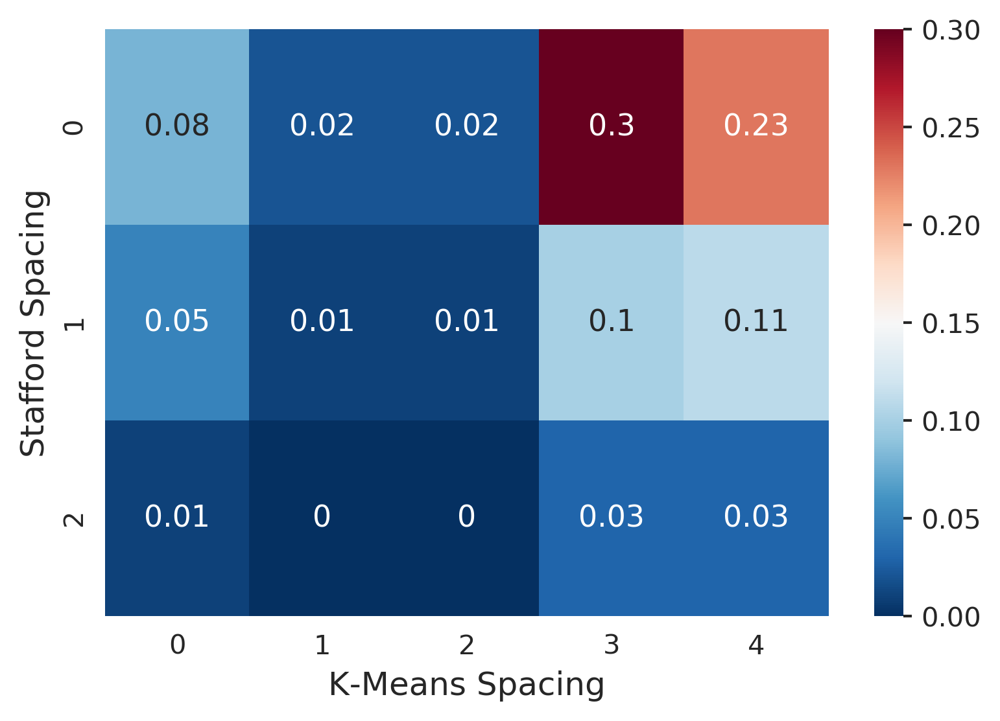

In [26]:
visualize_cluster_overlap(
    df[df['rule_clusters'] != -1], 
    'rule_clusters', 
    'km_clusters',
    groups_rmp={
        'rule_clusters': 'Stafford Spacing',
        'km_clusters': 'K-Means Spacing'
    }
)

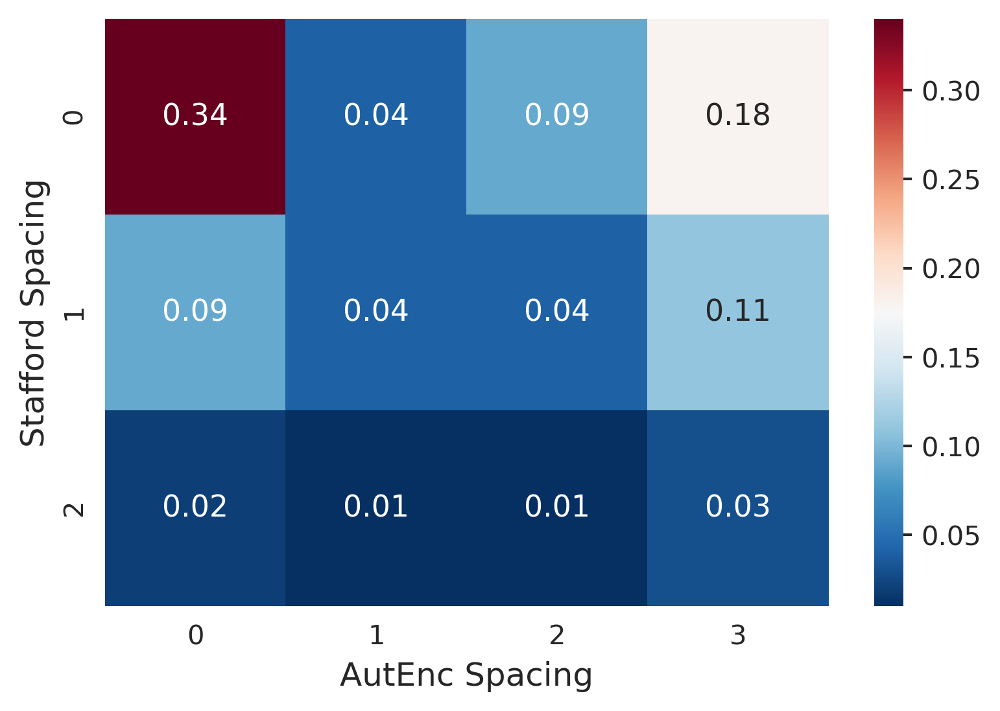

In [27]:
visualize_cluster_overlap(
    df[df['rule_clusters'] != -1], 
    'rule_clusters', 
    'rnn_clusters',
    groups_rmp={
        'rule_clusters': 'Stafford Spacing',
        'rnn_clusters': 'AutEnc Spacing'
    }
)

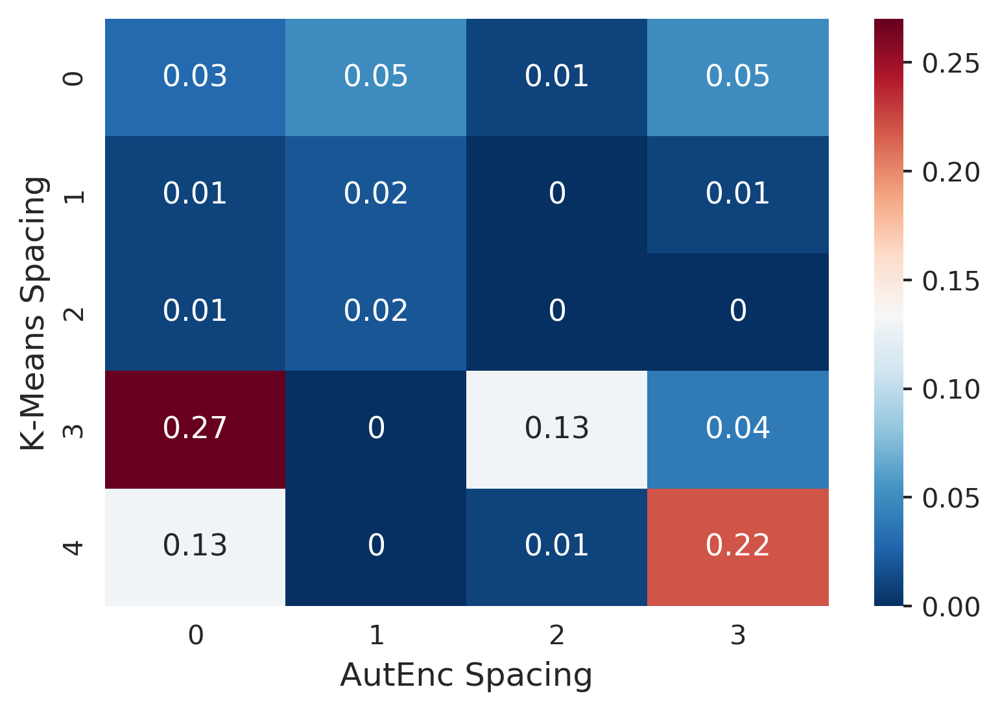

In [28]:
visualize_cluster_overlap(
    df[df['rule_clusters'] != -1], 
    'km_clusters', 
    'rnn_clusters',
    groups_rmp={
        'km_clusters': 'K-Means Spacing',
        'rnn_clusters': 'AutEnc Spacing'
    }
)

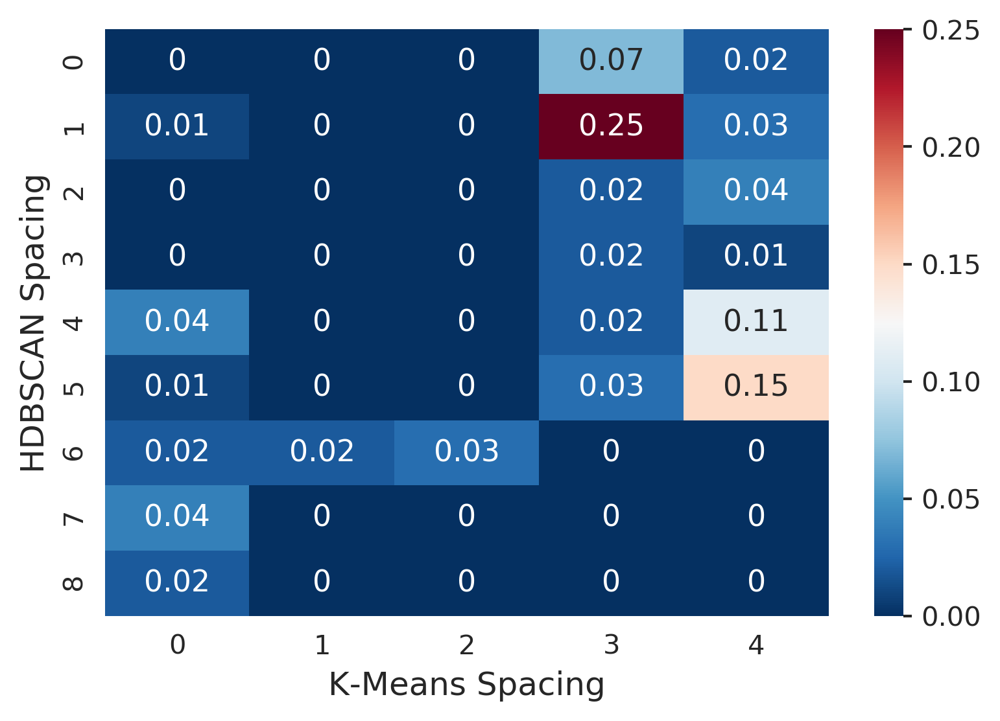

In [29]:
visualize_cluster_overlap(
    df[df['hdb_clusters'] != -1], 
    'hdb_clusters', 
    'km_clusters',
    groups_rmp={
        'hdb_clusters': 'HDBSCAN Spacing',
        'km_clusters': 'K-Means Spacing'
    }
)

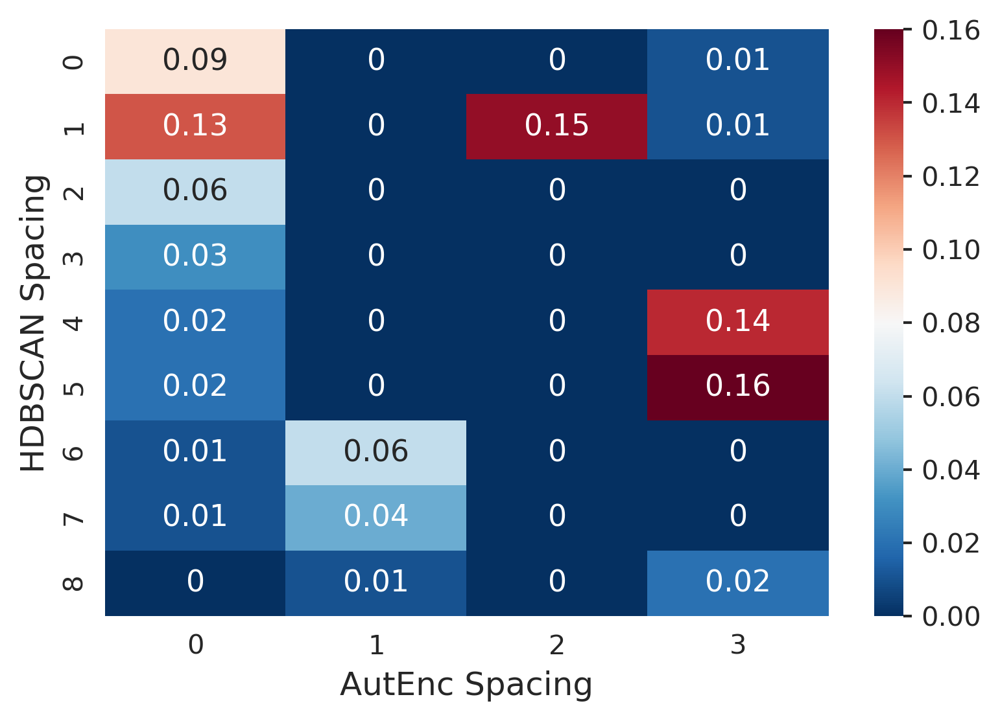

In [30]:
visualize_cluster_overlap(
    df[df['hdb_clusters'] != -1], 
    'hdb_clusters', 
    'rnn_clusters',
    groups_rmp={
        'hdb_clusters': 'HDBSCAN Spacing',
        'rnn_clusters': 'AutEnc Spacing'
    }
)

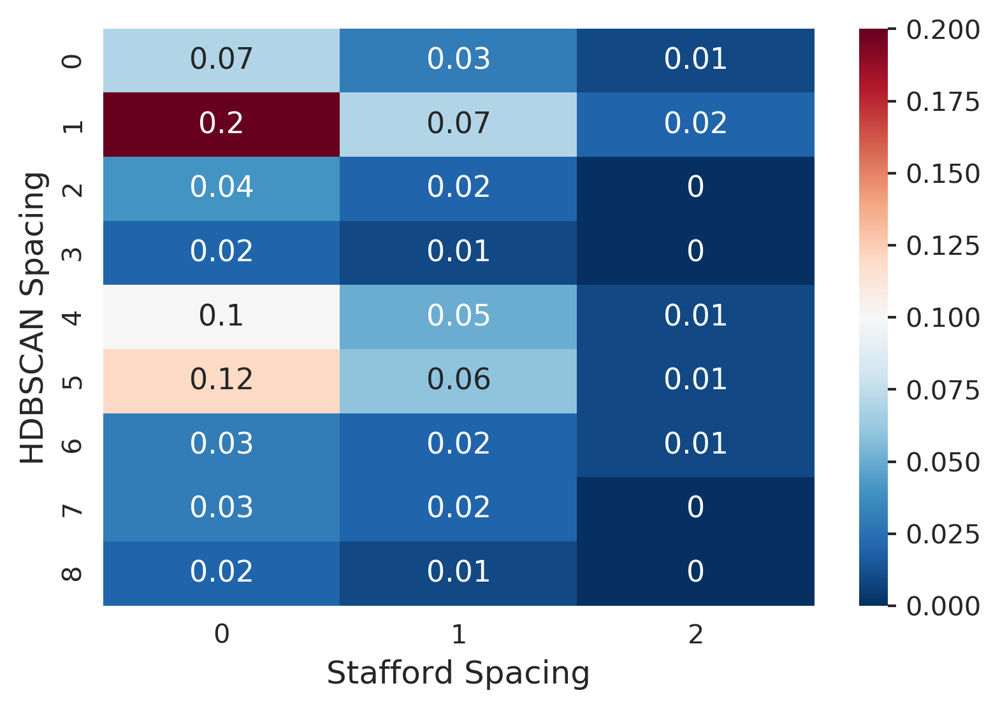

In [31]:
visualize_cluster_overlap(
    df[(df['hdb_clusters'] != -1) & (df['rule_clusters'] != -1)], 
    'hdb_clusters', 
    'rule_clusters',
    groups_rmp={
        'hdb_clusters': 'HDBSCAN Spacing',
        'rule_clusters': 'Stafford Spacing'
    }
)

### To CSV

In [57]:
df.to_csv('data\\df_non_smoothed.csv', index=False)